- 04/01 16:50 [안진용] 이니셜 커밋을 했습니다.
- 04/01 17:32 [이하은] 중복 이미지 탐지 결과를 커밋했습니다.
- 04/02 10:32 [천주호] 담당 부분 EDA 커밋
- 04/03 10:02 [김해원] EDA 완료. 전처리 파이프라인 설계 및 전처리 진행 코드 진행 예정
- 04/03 11:42 [김해원] EDA 및 파이프라인 설계 완료.
- 04/03 16:01 [김해원] 베이스라인 모델 정리 시작

# 0. 목차

1. **EDA 및 데이터 전처리 전략 설계**   
   1.1 샘플 이미지 확인   
   1.2 이미지 유사도 확인   
   1.3 클래스 별 이미지 수 확인   
   1.4 중복 이미지 탐지   
   1.5 이미지 품질 확인   
   1.6 EDA 결론 및 전처리 전략 설계
   
2. **데이터 전처리**   
   2.1 어쩌고저쩌고


3. **Baseline 모델 설계**

## 초기 세팅

In [5]:
#필요한 패키지 다운
!pip install wandb==0.16.0
!pip install opencv-python
!pip install ImageHash Pillow
!pip install rembg
!pip install onnxruntime

   ---------------------------------------- 0.0/11.8 MB ? eta -:--:--
   --------------- ------------------------ 4.5/11.8 MB 24.4 MB/s eta 0:00:01
   ---------------------------------------- 11.8/11.8 MB 29.5 MB/s eta 0:00:00


In [7]:
#필요한 모듈 임포트
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
import wandb
from wandb.keras import WandbCallback
from sklearn.preprocessing import LabelEncoder
from PIL import Image
import glob
import os
import matplotlib.pyplot as plt
import random
import cv2
import numpy as np
from pathlib import Path
import hashlib
import imagehash
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tqdm import tqdm
from rembg import remove
from PIL import Image
import io
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances, cosine_similarity
from sklearn.cluster import KMeans
from skimage.feature import hog
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV3Large
from tensorflow.keras.callbacks import ReduceLROnPlateau 
from tensorflow.keras.optimizers import Adam, RMSprop
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report

C:\Users\kimho\anaconda3\Lib\site-packages\paramiko\pkey.py:82: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "cipher": algorithms.TripleDES,
C:\Users\kimho\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.Blowfish and will be removed from this module in 45.0.0.
  "class": algorithms.Blowfish,
C:\Users\kimho\anaconda3\Lib\site-packages\paramiko\transport.py:243: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
  "class": algorithms.TripleDES,


In [127]:
#통합 작업을 위한 경로 취합

if os.path.exists("/aiffel/aiffel/jellyfish/Train_Test_Valid"):
    base_path = "/aiffel/aiffel/jellyfish/Train_Test_Valid"
elif os.path.exists("C:/Users/kimho/Dlthon_c1/Train_Test_Valid"):
    base_path = "C:/Users/kimho/Dlthon_c1/Train_Test_Valid"
elif os.path.exists("/root/aiffel/jellyfish/Train_Test_Valid"):
    base_path = "/root/aiffel/jellyfish/Train_Test_Valid"

train_path = os.path.join(base_path, "Train")
valid_path = os.path.join(base_path, "valid")
test_path = os.path.join(base_path, "Test")

----
# 1. EDA 및 데이터 전처리 전략 설계

## 1.0 시도한 EDA 목록

1. **샘플 이미지** 확인
      - 해파리 외의 미칠 다른 요소들이 있는가? (배경 등...)
      - 특정 무늬나 형태로 구분할 수 있는 해파리가 있는가?
      - 색깔로 구분할 수 있는 해파리가 있는가?
      - 하나의 사진에 해파리가 여러마리 들어있는 경우가 있는가?

</n>

2. 이미지 **유사도** 확인
      - 다른 종이지만 비슷하게 생긴 해파리가 있는가?

</n>

3. 클래스 별 **이미지 수** 확인   
      - 클래스 간 imbalance 가능성 확인

</n>

4. **중복** 이미지 탐지

</n>

5. 이미지 **품질** 확인
      - 흐리거나 노이즈가 있는 이미지가 있는가?

## 1.1 샘플 이미지 확인



### 1.1.1 내용 요약

**[확인 사항]**
  - 해파리 외의 미칠 다른 요소들이 있는가? (배경 등...)
  - 특정 무늬나 형태로 구분할 수 있는 해파리가 있는가?
  - 색깔로 구분할 수 있는 해파리가 있는가?
  - 하나의 사진에 해파리가 여러마리 들어있는 경우가 있는가?


**[과정]**
1. 각 클래스 별 test, Train 이미지 5장/20장씩 출력해보고, 해파리 외의 영향을 미칠 다른 요소 있는지 파악 시도. (배경 등)   
2. Moon_jellyfish의 배경색이 파란색일 때 blue_jellyfish와 비슷해 보임.
3. Moon_jellyfish와 blue_jellyfish 각 샘플 이미지 50장을 출력하여 유사 정도 파악 시도.
4. 발견 사항   
  1) 샘플 중 이미 증강 처리 된 데이터가 있음을 확인   
  2) blue_jellyfish 샘플 속 moon_jellyfish로 보이는 샘플 다수 발견

### 1.1.2 각 클래스 별 test, Train 이미지 5장/ 20장 출력

#### 1) barrel_jellyfish

In [ ]:
# 해파리 클래스 중 하나 선택
sample_class = "barrel_jellyfish"
class_path = os.path.join(train_path, sample_class)

# 파일 목록에서 무작위로 20장 선택
sample_images = random.sample(os.listdir(class_path), 20)

# 시각화
plt.figure(figsize=(20, 10))  # 사이즈도 키우기
for i, img_name in enumerate(sample_images):
    img_path = os.path.join(class_path, img_name)
    img = Image.open(img_path)
    plt.subplot(4, 5, i+1)  # 4행 5열
    plt.imshow(img)
    plt.title(sample_class.replace("_", " ").title())
    plt.axis("off")
plt.tight_layout()
plt.show()

#### 2) blue_jellyfish

In [ ]:
# 해파리 클래스 중 하나 선택
sample_class = "blue_jellyfish"
class_path = os.path.join(train_path, sample_class)

# 파일 목록에서 무작위로 5장 선택
sample_images = random.sample(os.listdir(class_path), 20)

# 시각화
plt.figure(figsize=(20, 10))  # 사이즈도 키우기
for i, img_name in enumerate(sample_images):
    img_path = os.path.join(class_path, img_name)
    img = Image.open(img_path)
    plt.subplot(4, 5, i+1)  # 4행 5열
    plt.imshow(img)
    plt.title(sample_class.replace("_", " ").title())
    plt.axis("off")
plt.tight_layout()
plt.show()

#### 3) compass_jellyfish

In [ ]:
# 해파리 클래스 중 하나 선택
sample_class = "compass_jellyfish"
class_path = os.path.join(train_path, sample_class)

# 파일 목록에서 무작위로 5장 선택
sample_images = random.sample(os.listdir(class_path), 20)

# 시각화
plt.figure(figsize=(20, 10))  # 사이즈도 키우기
for i, img_name in enumerate(sample_images):
    img_path = os.path.join(class_path, img_name)
    img = Image.open(img_path)
    plt.subplot(4, 5, i+1)  # 4행 5열
    plt.imshow(img)
    plt.title(sample_class.replace("_", " ").title())
    plt.axis("off")
plt.tight_layout()
plt.show()

#### 4) lions_mane_jellyfish

In [ ]:
# 해파리 클래스 중 하나 선택
sample_class = "lions_mane_jellyfish"
class_path = os.path.join(train_path, sample_class)

# 파일 목록에서 무작위로 5장 선택
sample_images = random.sample(os.listdir(class_path), 20)

# 시각화
plt.figure(figsize=(20, 10))  # 사이즈도 키우기
for i, img_name in enumerate(sample_images):
    img_path = os.path.join(class_path, img_name)
    img = Image.open(img_path)
    plt.subplot(4, 5, i+1)  # 4행 5열
    plt.imshow(img)
    plt.title(sample_class.replace("_", " ").title())
    plt.axis("off")
plt.tight_layout()
plt.show()

#### 5) mauve_stinger_jellyfish

In [ ]:
# 해파리 클래스 중 하나 선택
sample_class = "mauve_stinger_jellyfish"
class_path = os.path.join(train_path, sample_class)

# 파일 목록에서 무작위로 5장 선택
sample_images = random.sample(os.listdir(class_path), 20)

# 시각화
plt.figure(figsize=(20, 10))  # 사이즈도 키우기
for i, img_name in enumerate(sample_images):
    img_path = os.path.join(class_path, img_name)
    img = Image.open(img_path)
    plt.subplot(4, 5, i+1)  # 4행 5열
    plt.imshow(img)
    plt.title(sample_class.replace("_", " ").title())
    plt.axis("off")
plt.tight_layout()
plt.show()

#### 6) Moon_jellyfish

In [ ]:
# 해파리 클래스 중 하나 선택
sample_class = "Moon_jellyfish"
class_path = os.path.join(train_path, sample_class)

# 파일 목록에서 무작위로 5장 선택
sample_images = random.sample(os.listdir(class_path), 20)

# 시각화
plt.figure(figsize=(20, 10))  # 사이즈도 키우기
for i, img_name in enumerate(sample_images):
    img_path = os.path.join(class_path, img_name)
    img = Image.open(img_path)
    plt.subplot(4, 5, i+1)  # 4행 5열
    plt.imshow(img)
    plt.title(sample_class.replace("_", " ").title())
    plt.axis("off")
plt.tight_layout()
plt.show()

### 1.1.3 blue & Moon 비슷하여 샘플 50장 출력하여 비교하기

**why?**
- Moon_jellyfish의 배경색이 파란색일 때 blue_jellyfish와 비슷해 보임
- Moon_jellyfish와 blue_jellyfish 각 샘플 이미지 50장을 출력하여 유사 정도 파악 시도


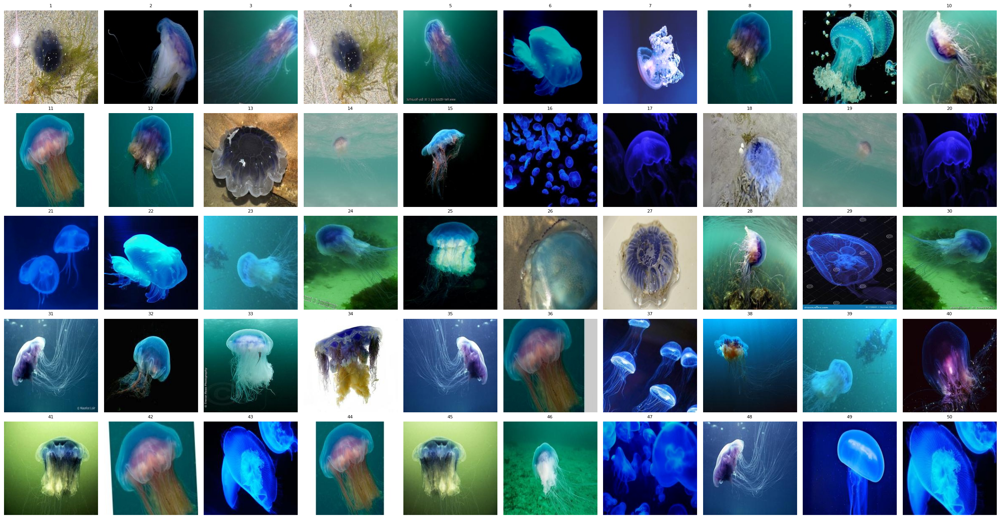

In [25]:
# 해파리 클래스 중 하나 선택
sample_class = "blue_jellyfish"
class_path = os.path.join(train_path, sample_class)

# 파일 목록에서 무작위로 50장 선택 (에러 방지용 min 사용)
image_files = os.listdir(class_path)
num_images = min(50, len(image_files))
sample_images = random.sample(image_files, num_images)

# 시각화 (5행 10열)
plt.figure(figsize=(25, 13))
for i, img_name in enumerate(sample_images):
    img_path = os.path.join(class_path, img_name)
    img = Image.open(img_path)
    plt.subplot(5, 10, i+1)
    plt.imshow(img)
    plt.title(f"{i+1}", fontsize=8)
    plt.axis("off")
plt.tight_layout()
plt.show()


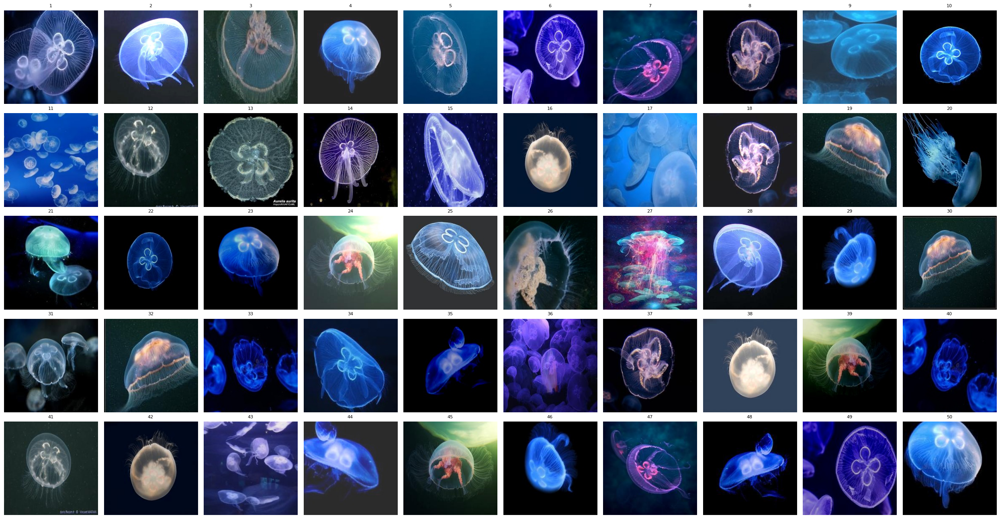

In [26]:
# 해파리 클래스 중 하나 선택
sample_class = "Moon_jellyfish"
class_path = os.path.join(train_path, sample_class)

# 파일 목록에서 무작위로 50장 선택 (에러 방지용 min 사용)
image_files = os.listdir(class_path)
num_images = min(50, len(image_files))
sample_images = random.sample(image_files, num_images)

# 시각화 (5행 10열)
plt.figure(figsize=(25, 13))
for i, img_name in enumerate(sample_images):
    img_path = os.path.join(class_path, img_name)
    img = Image.open(img_path)
    plt.subplot(5, 10, i+1)
    plt.imshow(img)
    plt.title(f"{i+1}", fontsize=8)
    plt.axis("off")
plt.tight_layout()
plt.show()


### 1.1.4 결론

1.   
- **확인 사항:** 해파리 외 판별에 영향을 미칠 다른 요소들이 있는가?
- **결론:** 배경색이 가지각색이라 판별에 영향을 미칠 수 있을 것으로 판단됨
- **대응 전략:** Grad-CAM을 통해서 판별이 가능할 것이나,    
Moon과 Blue jellyfish 를 제외한 모든 해파리는 고유의 색을 가지고 있기 때문에    
선제적으로 대응할 필요는 없을 것으로 보인다.   
추후 추가적인 정확도 향상이 필요할 시 적용 예정.


2.   
- **확인 사항:** 특정 무늬나 형태로 구분할 수 있는 해파리가 있는가?
- **결론:** 모든 해파리는 고유한 형태와 패턴을 가지고있어 판별에 사용할 수 있다.
- **대응 전략:** 텍스처 시각화로 정확도를 높인다.

3.
- **확인 사항:** 색깔로 구분할 수 있는 해파리가 있는가?
- **결론:** 모든 해파리는 고유의 색깔을 가지고 있으나, 이미지의 빛 정도 등에 따라 색상의 왜곡이 있어 판별에 사용하기는 어렵다.
- **대응 전략:** X

4.
- **확인 사항:** 하나의 사진에 해파리가 여러마리 들어있는 경우가 있는가?
- **결론:** 있다.
- **대응 전략:** 하지만 이것이 판별에 영향을 미치는지는 따져볼 필요가 있음.
  - 논문 Deep Learning for Computer Vision (Adrian Rosebrock, PyImageSearch) 및 Stanford CS231n (Fei-Fei Li et al.) – Lecture Notes에 의거하면,   
   **하나의 이미지에 동일 종 해파리가 여러 마리 있어도, 선명하고 명확하면 문제 없음.   
  다만 겹쳐 있거나 중심이 애매한 경우는 노이즈가 됨.**
  - **추후 정확도를 올릴 필요가 있다면, GradCAM을 통해 학습된 모델이 집중하는 부분을 확인 후 대응**

5.
- **추가 확인 사항:** 샘플 중 이미 증강 처리 된 데이터가 있음을 확인
- **대응 전략:** 증강 및 미증강 이미지 수를 확인하고, 데이터 수를 본 후 판단

6.    
- **추가 확인 사항:** blue_jellyfish 샘플 속 moon_jellyfish로 보이는 샘플 다수 발견
- **대응 전략:**    
    1) moon jellyfish를 먼저 학습시킨다.   
    2) blue jellyfish 샘플 중 moon jellyfish로 판별되는 이미지 샘플을 추출하여 제거한다.   
    3) 남은 blue jellyfish 이미지 셋만을 가지고 학습시킨다. (추가 증강 필요)

---

## 1.2 이미지 유사도 확인

### 1.2.1 내용 요약


**[확인 사항]**
- 다른 종이지만 비슷하게 생긴 해파리 확인


**[과정]**
1. 색상 유사도 확인
    1) 각 이미지의 배경 제거
    2) 클래스 별 3가지 dominant color 추출
    3) 클래스 간 평균 대표 색상끼리 거리(Euclidean) 계산
    4) 유사도 시각화 & 분석
       
2. 형태 유사도 확인
   1) 각 이미지의 배경 제거
   2) 이미지 resize & 흑백으로 변환(grayscale)
   3) HOG descriptor 추출
   4) 클래스 당 여러 이미지 -> 평균 HOG 벡터 생성
   5) 클래스 간 cosine 유사도 계산
   6) heatmap + 상위 유사 쌍 출력


### 1.2.2 색상 유사도 확인

In [37]:
classes = [
    "barrel_jellyfish",
    "blue_jellyfish",
    "compass_jellyfish",
    "lions_mane_jellyfish",
    "mauve_stinger_jellyfish",
    "Moon_jellyfish"
]

# 배경 제거 함수
def remove_background_cv2(cv_img):
    pil_img = Image.fromarray(cv2.cvtColor(cv_img, cv2.COLOR_BGR2RGB))
    output = remove(pil_img)
    return cv2.cvtColor(np.array(output), cv2.COLOR_RGBA2RGB)


# dominant color 추출 (대표 색상 3개)
def get_dominant_colors(img, k=3):
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    pixels = img_rgb.reshape(-1, 3)
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
    kmeans.fit(pixels)
    return kmeans.cluster_centers_  # (k, 3)

def get_class_representative_color(class_dir, max_images=15, k=3):
    files = [f for f in os.listdir(class_dir) if f.endswith(".jpg") and "aug" not in f]
    dom_colors = []
    for f in tqdm(files[:max_images], desc=os.path.basename(class_dir)):
        img_path = os.path.join(class_dir, f)
        img = cv2.imread(img_path)
        if img is None:
            continue
        try:
            img_nobg = remove_background_cv2(img)
            doms = get_dominant_colors(img_nobg, k=k)
            dom_colors.extend(doms)
        except:
            print(f"⚠️ 배경 제거 실패: {f}")
    if dom_colors:
        return np.mean(dom_colors, axis=0)  # (3,) RGB 평균
    else:
        return np.array([0, 0, 0])  # fallback

Moon_jellyfish: 100%|████████████████████████████████████████████████████████████████████████| 15/15 [00:14<00:00,  1.01it/s]


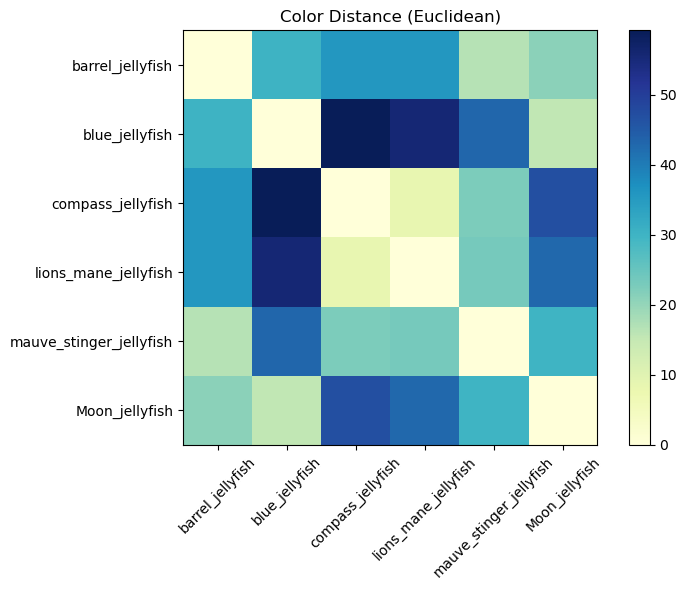


🎨 대표 색상 유사도가 가장 가까운 클래스 TOP 5 (Euclidean 거리):
compass_jellyfish ↔ lions_mane_jellyfish : 거리 = 8.44
blue_jellyfish ↔ Moon_jellyfish : 거리 = 15.29
barrel_jellyfish ↔ mauve_stinger_jellyfish : 거리 = 16.51
barrel_jellyfish ↔ Moon_jellyfish : 거리 = 20.95
compass_jellyfish ↔ mauve_stinger_jellyfish : 거리 = 22.58


In [43]:
# 유사도 분석 및 시각화
def show_similarity_matrix(dist_matrix, labels, title="Color Distance (Euclidean)"):
    plt.figure(figsize=(8, 6))
    plt.imshow(dist_matrix, cmap="YlGnBu")
    plt.title(title)
    plt.colorbar()
    plt.xticks(ticks=np.arange(len(labels)), labels=labels, rotation=45)
    plt.yticks(ticks=np.arange(len(labels)), labels=labels)
    plt.tight_layout()
    plt.show()

def print_most_similar(dist_matrix, labels, top_k=5):
    pairs = []
    for i in range(len(labels)):
        for j in range(i + 1, len(labels)):
            dist = dist_matrix[i, j]
            pairs.append((labels[i], labels[j], dist))
    sorted_pairs = sorted(pairs, key=lambda x: x[2])
    print(f"\n🎨 대표 색상 유사도가 가장 가까운 클래스 TOP {top_k} (Euclidean 거리):")
    for a, b, d in sorted_pairs[:top_k]:
        print(f"{a} ↔ {b} : 거리 = {d:.2f}")

# 실행
if __name__ == "__main__":
    representative_colors = {}
    for cls in classes:
        class_dir = os.path.join(train_path, cls)
        rep_color = get_class_representative_color(class_dir, max_images=15, k=3)
        representative_colors[cls] = rep_color

    labels = list(representative_colors.keys())
    color_matrix = np.array([representative_colors[cls] for cls in labels])
    dist_matrix = euclidean_distances(color_matrix)

    show_similarity_matrix(dist_matrix, labels)
    print_most_similar(dist_matrix, labels)

**[색상 유사도 결론]**

1.    
- **발견 사항:** compass <-> lions_mane (거리 8.44): 매우 유사함.   
- **대응 전략:** 전처리나 모델 설계에서 형태 강조 필요  

2.   
- **발견 사항:** 유사도 15~25 사이의 유사한 색상 그룹 다수
- **대응 전략:** 모델이 형태에 집중하도록 해야할지 판단 필요

### 1.2.3 형태 유사도 확인

In [47]:
# HOG descriptor 추출
def extract_HOG_features(img, resize=(128, 128)):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    resized = cv2.resize(gray, resize)
    features = hog(resized, orientations=9, pixels_per_cell=(8, 8),
                   cells_per_block=(2, 2), block_norm='L2-Hys', visualize=False)
    return features  # 1D 벡터


#평균 HOG 벡터 생성
def get_class_HOG_average(class_dir, max_images=15):
    files = [f for f in os.listdir(class_dir) if f.endswith(".jpg") and "aug" not in f]
    hogs = []
    for f in tqdm(files[:max_images], desc=os.path.basename(class_dir)):
        img_path = os.path.join(class_dir, f)
        img = cv2.imread(img_path)
        if img is None:
            continue
        try:
            img_nobg = remove_background_cv2(img)
            feat = extract_HOG_features(img_nobg)
            hogs.append(feat)
        except:
            print(f"⚠️ 처리 실패: {f}")
    if hogs:
        return np.mean(hogs, axis=0)
    else:
        return np.zeros((8100,))  # 기본 크기 (128x128 기준)

Moon_jellyfish: 100%|████████████████████████████████████████████████████████████████████████| 15/15 [00:21<00:00,  1.43s/it]


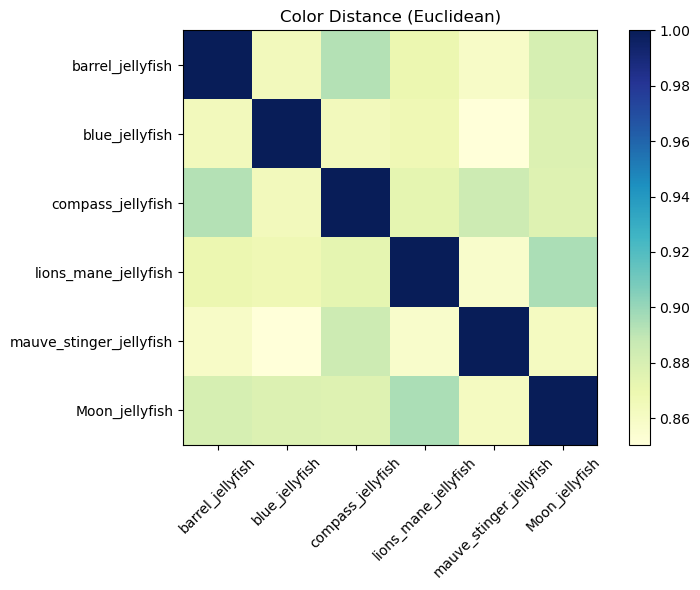


🧱 형태 기반 유사도가 높은 클래스 TOP 5:
lions_mane_jellyfish ↔ Moon_jellyfish : 유사도 = 0.8953
barrel_jellyfish ↔ compass_jellyfish : 유사도 = 0.8925
compass_jellyfish ↔ mauve_stinger_jellyfish : 유사도 = 0.8848
barrel_jellyfish ↔ Moon_jellyfish : 유사도 = 0.8807
blue_jellyfish ↔ Moon_jellyfish : 유사도 = 0.8777


In [51]:
def print_top_similar_pairs(sim_matrix, labels, top_k=5):
    pairs = []
    for i in range(len(labels)):
        for j in range(i + 1, len(labels)):
            sim = sim_matrix[i, j]
            pairs.append((labels[i], labels[j], sim))
    sorted_pairs = sorted(pairs, key=lambda x: -x[2])
    print(f"\n🧱 형태 기반 유사도가 높은 클래스 TOP {top_k}:")
    for a, b, score in sorted_pairs[:top_k]:
        print(f"{a} ↔ {b} : 유사도 = {score:.4f}")

# -----------------------------
# 실행
# -----------------------------
if __name__ == "__main__":
    hog_features = {}
    for cls in classes:
        class_dir = os.path.join(train_path, cls)
        hog_features[cls] = get_class_HOG_average(class_dir, max_images=15)

    labels = list(hog_features.keys())
    hog_matrix = np.array([hog_features[cls] for cls in labels])
    sim_matrix = cosine_similarity(hog_matrix)

    show_similarity_matrix(sim_matrix, labels)
    print_top_similar_pairs(sim_matrix, labels)

**[형태 유사도 결론]**

1.    
- **발견 사항:** Moon_jellyfish가 5개 중 3개의 쌍에서 나타남   
- **대응 전략:** 분리 학습 또는 샘플 강조 등 별도 처리 필요  

### 1.2.4 결론

배경만 지우자...

인데 좀 더 예쁘게 써야함.

----

## 1.3 클래스 별 이미지 수 확인

**[확인 사항]**
  - 클래스 간 이미지 셋의 수를 확인하여 imbalance 확인

                     Class  Total  Original  Augmented
0         barrel_jellyfish    150        41        109
1           blue_jellyfish    150        55         95
2        compass_jellyfish    150        57         93
3     lions_mane_jellyfish    150        61         89
4  mauve_stinger_jellyfish    150        58         92
5           Moon_jellyfish    150        47        103


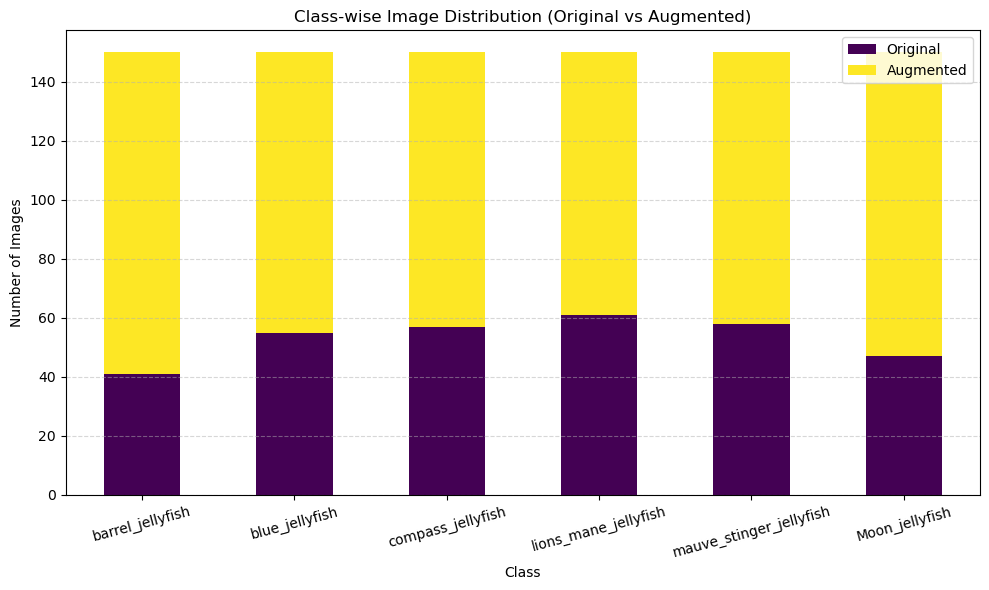

In [49]:
# 이미지 확장자 정의
valid_exts = [".jpg", ".jpeg", ".png"]

# 무시할 폴더
exclude_folders = ['.ipynb_checkpoints', 'Train_Test_Valid']

# 결과 저장용 리스트
class_stats = []

# 클래스별 루프
for class_folder in os.listdir(train_path):
    if class_folder in exclude_folders or not os.path.isdir(os.path.join(train_path, class_folder)):
        continue

    class_path = os.path.join(train_path, class_folder)
    all_files = os.listdir(class_path)

    image_files = [f for f in all_files if os.path.splitext(f)[-1].lower() in valid_exts]
    aug_images = [f for f in image_files if "aug" in f.lower()]
    orig_images = [f for f in image_files if "aug" not in f.lower()]

    class_stats.append({
        "Class": class_folder,
        "Total": len(image_files),
        "Original": len(orig_images),
        "Augmented": len(aug_images)
    })

# DataFrame으로 출력
df_stats = pd.DataFrame(class_stats)
print(df_stats)

# 시각화 (원본 + 증강)
df_stats.set_index("Class")[["Original", "Augmented"]].plot(kind="bar", stacked=True, figsize=(10,6), colormap="viridis")
plt.title("Class-wise Image Distribution (Original vs Augmented)")
plt.ylabel("Number of Images")
plt.xticks(rotation=15)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

### 1.3.1 결론


**확인 사항:** 클래스 별 이미지 수의 imbalance가 존재하는가?   
**결론:**
- 약한 불균형은 존재하지만, 문제 될 정도는 아님.
  - 가장 원본이 적은 클래스는 41장 (27%)
  - 가장 원본이 많은 클래스는 61장 (40%)

**대응 전략:** 큰 문제 없으나, 필요 시 early stopping, val set 기준 평가, mixup 등으로 커버 가능

---
## 1.4 중복 이미지 탐지

### 1.4.1 내용 요약

**[확인 사항]**   
**1. 완전 동일한 이미지 탐지 :** 바이트 해시 (MD5)를 통해 이미지 내용을 바이트 단위로 읽고 hash를 계산해서 비교   
**2. 유사 이미지 탐지 :** Perceptual Hash에서 imagehash 라이브러리를 사용해서 비슷한 이미지를 탐지

**[결과]**
- 완전 중복 이미지 x
- 유사한 이미지 o(66쌍)

### 1.4.2 완전 동일한 이미지 유무 확인
- 완전히 똑같은 이미지는 없음.

In [51]:
def get_file_hash(file_path):
    with open(file_path, "rb") as f:
        return hashlib.md5(f.read()).hexdigest()

hash_dict = {}
dup_files = []

for root, _, files in os.walk(base_path):
    for file in files:
        path = os.path.join(root, file)
        if os.path.splitext(file)[-1].lower() in [".jpg", ".jpeg", ".png"]:  # 이미지 파일만
            file_hash = get_file_hash(path)
            if file_hash in hash_dict:
                dup_files.append((path, hash_dict[file_hash]))
            else:
                hash_dict[file_hash] = path

print(f"완전히 동일한 이미지 수: {len(dup_files)}")
for dup in dup_files:  # 전체 출력
    print(f"중복쌍:\n  {dup[0]}\n  {dup[1]}\n")

완전히 동일한 이미지 수: 0


### 1.4.3 유사한 이미지 있는지 확인
- 66쌍 존재하는 것을 확인함.(유사하는 쌍을 찾도록 함, 증강된 데이터셋이라 유사한 이미지가 2개 아니라, 3개일 수도...? 필요시 추가 확인)
- 쌍으로 페어된 이미지를 나란히 출력하여 확인함.

In [57]:
phash_dict = {}
similar_imgs = []

for root, _, files in os.walk(base_path):
    for file in files:
        path = os.path.join(root, file)
        try:
            if os.path.splitext(file)[-1].lower() in [".jpg", ".jpeg", ".png"]:
                img = Image.open(path).convert("RGB").resize((256, 256))
                phash = imagehash.phash(img)
                if phash in phash_dict:
                    similar_imgs.append((path, phash_dict[phash]))
                else:
                    phash_dict[phash] = path
        except Exception as e:
            print(f"불러오기 실패: {path} ({e})")
            continue

print(f"유사 이미지로 감지된 쌍 수: {len(similar_imgs)}")
for sim in similar_imgs[:5]:
    print(f"유사쌍:\n  {sim[0]}\n  {sim[1]}\n")


유사 이미지로 감지된 쌍 수: 66
유사쌍:
  C:/Users/kimho/Dlthon_c1/Train_Test_Valid\Train\barrel_jellyfish\22.jpg
  C:/Users/kimho/Dlthon_c1/Train_Test_Valid\test\barrel_jellyfish\16.jpg

유사쌍:
  C:/Users/kimho/Dlthon_c1/Train_Test_Valid\Train\barrel_jellyfish\aug-106-31.jpg
  C:/Users/kimho/Dlthon_c1/Train_Test_Valid\Train\barrel_jellyfish\31.jpg

유사쌍:
  C:/Users/kimho/Dlthon_c1/Train_Test_Valid\Train\barrel_jellyfish\aug-107-32.JPG
  C:/Users/kimho/Dlthon_c1/Train_Test_Valid\Train\barrel_jellyfish\32.JPG

유사쌍:
  C:/Users/kimho/Dlthon_c1/Train_Test_Valid\Train\barrel_jellyfish\aug-16-21.jpg
  C:/Users/kimho/Dlthon_c1/Train_Test_Valid\Train\barrel_jellyfish\21.jpg

유사쌍:
  C:/Users/kimho/Dlthon_c1/Train_Test_Valid\Train\barrel_jellyfish\aug-41-01.jpeg
  C:/Users/kimho/Dlthon_c1/Train_Test_Valid\Train\barrel_jellyfish\01.jpeg



#### 유사한 이미지 쌍 출력해보기
- 비슷하다고 판단된 이미지는 약한 데이터 증강으로 추측.
- 유사한 이미지가 학습에 유용할지 방해될지 판단 필요할 수 있음.
- 삭제하거나 병합하면 샘플 수가 줄어든다는 문제 발생.   
 -> 추후 필요하다면, 약한 증강 이미지 삭제 후 샘플 수를 맞춰 재증강 예정

In [ ]:
# 앞에서 감지된 유사 이미지 쌍 리스트: similar_imgs
# 시각화 개수 설정 (예: 10쌍)
num_to_display = min(30, len(similar_imgs)) # 수를 수정하여 출력 쌍의 개수를 조절 가능.

for i in range(num_to_display):
    img_path1, img_path2 = similar_imgs[i]

    img1 = Image.open(img_path1)
    img2 = Image.open(img_path2)

    plt.figure(figsize=(8, 4))
    plt.suptitle(f"similar images {i+1}")

    plt.subplot(1, 2, 1)
    plt.imshow(img1)
    plt.title("Image 1")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(img2)
    plt.title("Image 2")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


----
## 1.5 이미지 품질 확인

### 1.5.1 내용 요약

**[확인 사항]**   
**1. 이미지 품질 확인**(저품질의 데이터를 학습시키면 모델 품질 또한 저하될 우려가 있으므로)   

**[결과]**


In [83]:
# 설정
valid_exts = [".jpg", ".jpeg", ".png"]
exclude_folders = ['.ipynb_checkpoints', 'Train_Test_Valid']

# 결과 저장용 리스트
image_quality_stats = []

# 클래스별 순회
for class_folder in os.listdir(train_path):
    if class_folder in exclude_folders or not os.path.isdir(os.path.join(train_path, class_folder)):
        continue

    class_path = os.path.join(train_path, class_folder)

    for img_name in tqdm(os.listdir(class_path), desc=f"{class_folder}"):
        if "aug" in img_name.lower():
            continue  # 증강 이미지 제외
        if not os.path.splitext(img_name)[-1].lower() in valid_exts:
            continue

        img_path = os.path.join(class_path, img_name)
        img = cv2.imread(img_path)

        if img is None:
            continue

        # 해상도
        height, width = img.shape[:2]

        # 블러 측정 (Laplacian variance)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        blur_score = cv2.Laplacian(gray, cv2.CV_64F).var()

        # 밝기 측정 (Mean pixel intensity)
        brightness = np.mean(gray)

        image_quality_stats.append({
            "Class": class_folder,
            "Image": img_name,
            "Width": width,
            "Height": height,
            "BlurScore": blur_score,
            "Brightness": brightness
        })

# 결과를 DataFrame으로
df_quality = pd.DataFrame(image_quality_stats)

# 품질 낮은 이미지(흐린) 예시 출력 (blur 낮은 순)
print("\n저품질(흐린) 이미지:")
print(df_quality.sort_values("BlurScore").head(10))

# 너무 어두운 이미지 확인
dark_imgs = df_quality[df_quality["Brightness"] < 30]
print("\n어두운 이미지:")
print(dark_imgs)

Moon_jellyfish: 100%|████████████████████████████████████████████████████████████████████| 150/150 [00:00<00:00, 2529.45it/s]


저품질(흐린) 이미지:
                       Class   Image  Width  Height  BlurScore  Brightness
71            blue_jellyfish  43.jpg    224     224  20.655034  148.350646
235  mauve_stinger_jellyfish  28.jpg    224     224  26.350968   83.180843
48            blue_jellyfish  11.jpg    224     224  35.319192   13.710678
285           Moon_jellyfish  18.jpg    224     224  39.590727   39.107681
59            blue_jellyfish  28.jpg    224     224  39.991350   38.622389
17          barrel_jellyfish  22.jpg    224     224  43.967907  146.725745
14          barrel_jellyfish  18.jpg    224     224  45.339422  156.200076
36          barrel_jellyfish  45.jpg    224     224  53.095840  102.897381
7           barrel_jellyfish  10.jpg    224     224  62.822046  121.940310
79            blue_jellyfish  53.jpg    224     224  66.218120   35.171217

어두운 이미지:
                       Class   Image  Width  Height    BlurScore  Brightness
43            blue_jellyfish  04.jpg    224     224   211.711694   22.1169

#### 어두운 이미지 시각화

**why?**
- 해파리 자체는 밝은데 배경이 어두운 경우일 수 있음
    - 해파리가 잘 보이면 ok
    - 해파리까지 어두우면 제거 후보

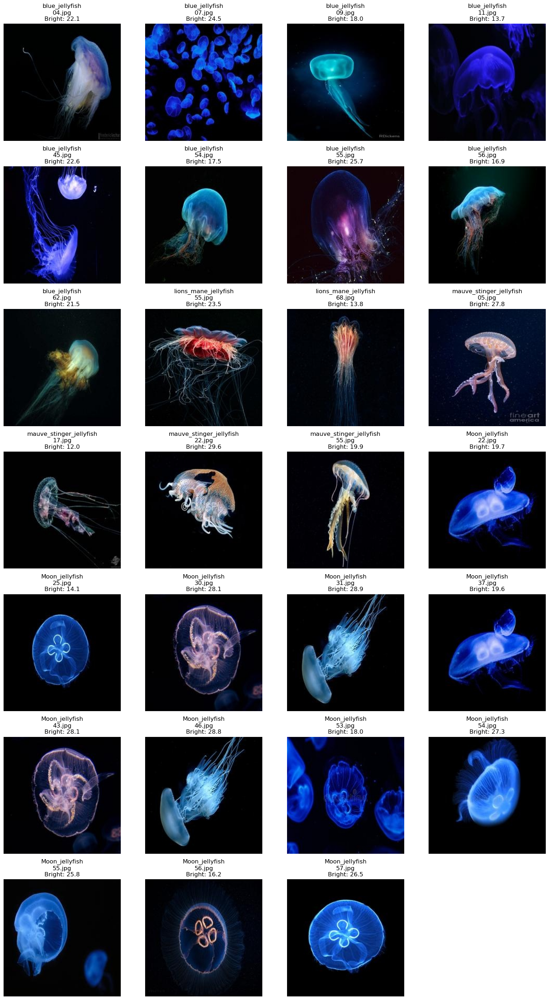

In [89]:
# 어두운 이미지 샘플 시각화

# 밝기 임계값
BRIGHTNESS_THRESHOLD = 30

# 어두운 이미지 필터링
dark_imgs = df_quality[df_quality["Brightness"] < BRIGHTNESS_THRESHOLD].reset_index(drop=True)

# 시각화
num_imgs = len(dark_imgs)
cols = 4
rows = (num_imgs + cols - 1) // cols

plt.figure(figsize=(cols * 4, rows * 4))
for i, row in enumerate(dark_imgs.itertuples()):
    img_path = os.path.join(train_path, row.Class, row.Image)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(f"{row.Class}\n{row.Image}\nBright: {row.Brightness:.1f}")
    plt.axis("off")

plt.tight_layout()
plt.show()

### 1.5.2 결론

**확인 사항:** 이미지 품질 확인(저품질의 데이터를 학습시키면 모델 품질 또한 저하될 우려가 있으므로)   
**결론:**
- 모든 저품질(흐리거나 어두움) 이미지는 원본에서 나타났음
- 흐린 이미지의 경우, 총 900개 데이터 중 10개에 불과하기 때문에 큰 영향을 미치지 않을 것으로 판단됨
- 어두운 이미지의 경우, 모든 데이터가 배경만 어두우며, 해파리 자체는 밝음

**대응 전략:** 흐린 이미지 & 어두운 이미지 모두 그대로 사용

----
## 1.6 EDA 결론 및 전처리 전략 설계

1. 배경색 제거

</br>

2. blue jellyfish 데이터셋 내에 moon jellyfish가 들어있는 문제
   1) moon jellyfish 선학습
   2) moon jellyfish 모델로 blue jellyfish 내의 이미지 판별
   3) moon jellyfish라고 판별 된 이미지 제거 후 나머지 이미지 증강   

</br>

3. (확인 후 대응) 텍스처 시각화
   - 색상, 형태 모두 유사도가 높았음. 남은 건 텍스처 뿐.

</br>

4. (확인 후 대응) 한 이미지 내에 복수 해파리가 있는 경우 대응 필요할지 판단

</br>

5. (사후 대응) 학습 데이터셋이 부족한 경우 추가 증강

</br>

6. (사후 대응) 66쌍의 약한 증강을 거친 유사 이미지 셋에 대해,
   - 추후 모델의 정확도 개선이 어렵고 과적합이 빠르게 높아진다면,
     중복 이미지를 제거한 후 재증강 예정.

-----
# 2. 데이터 전처리

----
# 3. Baseline 모델 설계

## 3.0 모델 톺아보기

### 3.0.1 후보 모델 목록

#### 1. CNN
   - **특징:** 전통적인 Conv → ReLU → Pool 구조 기반의 단순한 CNN
   - **장점:** 구조 이해가 쉬움, 빠른 실험 가능
   - **단점:** 성능 한계 명확
#### 2. mobilenet v2
   - **특징:** 경량화 모델 (모바일용)
   - **장점:** 빠름, 극소량의 자원에서도 학습 가능
   - **단점:** 성능 ceiling 낮음
#### 3. mobilenet v3
   - **특징:** Depthwise Separable Conv + Squeeze-Excite + NAS 기반 경량 구조 (모바일, 경량)
   - **장점:** 빠름, 적은 자원에서도 작동
   - **단점:** 표현력 한계 있음, 중간 복잡도의 태스크에서 성능 ceiling 존재
#### 4. ConvNext
   - **특징:** 최신 CNN 계열 (ViT 스타일 구조 도입)	
   - **장점:** 최신성, 성능 좋음	
   - **단점:** 무거움, baseline으론 과할 수도
#### 5. Resnet50
   - **특징:** skip connection으로 딥러닝 안정화
   - **장점:** 높은 성능, 빠른 수렴
   - **단점:** 구조 복잡도 다소 있음
#### 6. EfficientNet(5개 다 성과 잘 안나왔을 때 후보...)
   - **특징:** 계산량 대비 정확도 최고 수준
   - **장점:** 가볍고 성능 좋음 (SOTA 계열)	
   - **단점:** 구조가 black-box 느낌 있음

### 3.0.2 베이스라인 모델 요구 사항 정리 및 모델 선택

#### **[베이스라인 모델 요구사항]**
1. **데이터 특성과 모델 구조 간의 적합성**   
   Jellyfish 데이터셋은 클래스 간 색상과 형태의 유사성이 높고,   
   데이터 수가 제한적이기 때문에,   
   지나치게 깊거나 복잡한 모델은 과적합 우려가 있음.   
   -> 적당한 표현력과 경량성의 균형이 맞는 모델 필요
   
2. **모델 경량성과 실험 효율성**   
   베이스라인이므로, 빠른 실험 사이클을 가능하게 하며   
   적절한 수준의 성능까지 보장하는 모델 필요


#### **[베이스라인 모델 선택]**
요구사항의 두가지 기준을 고려하여, 해당 조건을 모두 만족시킬 수 있는   
**MobileNetV3** 로 베이스라인 모델 선정.

### 3.0.3 모든 모델에서 확인할 핵심 아웃풋 지표

|지표|설명|베이스라인 선택에 미치는 영향|
|---|---|---|
|Confusion Matrix|어떤 클래스에서 자주 틀리는지|형태 vs 색상 헷갈림 여부 분석|
|GradCAM|모델이 어디를 보고 분류했는가|모델이 의미 있는 영역 보는지 확인|
|학습 곡선|Overfitting or underfitting 빠르게 확인|복잡도에 비해 충분한 학습이 되는지|

----
## 3.1 베이스라인 모델 개발 - MobileNetV3

Found 900 files belonging to 6 classes.
Found 39 files belonging to 6 classes.
Found 40 files belonging to 6 classes.
12683000/12683000 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ MobileNetV3Large (Functional)        │ (None, 7, 7, 960)           │       2,996,352 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 960)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 960)                 │           3,840 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │         123,008 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 6)                   │             390 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,132,614 (11.95 MB)

 Trainable params: 133,958 (523.27 KB)

 Non-trainable params: 2,998,656 (11.44 MB)

Epoch 1/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 12s 216ms/step - accuracy: 0.2729 - loss: 2.2468 - val_accuracy: 0.5385 - val_loss: 1.1958 - learning_rate: 0.0010
Epoch 2/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 145ms/step - accuracy: 0.6035 - loss: 1.0713 - val_accuracy: 0.6410 - val_loss: 0.9922 - learning_rate: 0.0010
Epoch 3/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - accuracy: 0.7590 - loss: 0.7287 - val_accuracy: 0.6410 - val_loss: 0.9009 - learning_rate: 0.0010
Epoch 4/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - accuracy: 0.7905 - loss: 0.6050 - val_accuracy: 0.6923 - val_loss: 0.8367 - learning_rate: 0.0010
Epoch 5/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - accuracy: 0.8741 - loss: 0.4141 - val_accuracy: 0.6923 - val_loss: 0.8615 - learning_rate: 0.0010
Epoch 6/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 178ms/step - accuracy: 0.8769 - loss: 0.3754 - val_accuracy: 0.6923 - val_loss: 0.8213 - learning_rate: 0.0010
Epoch 7/30
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 182ms/step - accuracy: 0.9049 - loss: 0.3038 -

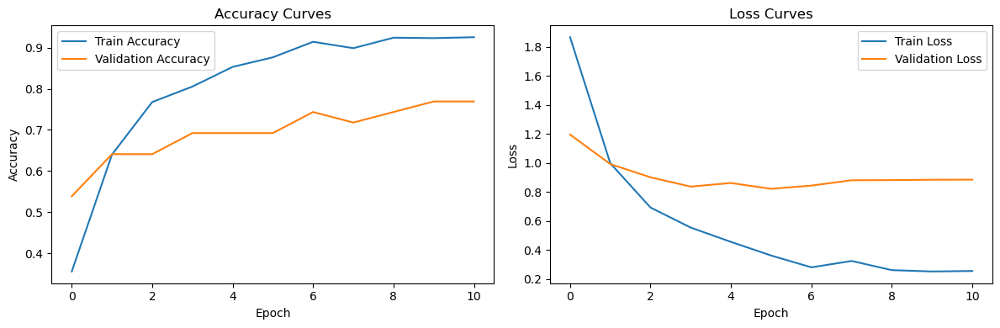

In [129]:
# 데이터셋 생성 함수
def create_dataset(directory, img_size=(224, 224), batch_size=32):
    return tf.keras.utils.image_dataset_from_directory(
        directory,
        image_size=img_size,
        batch_size=batch_size
    )

# 데이터셋 생성
train_ds = create_dataset(train_path)
valid_ds = create_dataset(valid_path)
test_ds = create_dataset(test_path)

# MobileNetV3Large 기반 모델 구축
base_model = MobileNetV3Large(input_shape=(224, 224, 3), include_top=False, weights='imagenet')
base_model.trainable = False

model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.BatchNormalization(),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(64, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(6, activation='softmax')
])

# 모델 컴파일
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

# 모델 요약 정보 출력
model.summary()

# 콜백 설정
callbacks = [
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True),
    tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, min_lr=1e-5)
]

# 모델 학습
history = model.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=30,
    callbacks=callbacks
)

# 성능 시각화
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy Curves')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss Curves')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.tight_layout()
plt.show()

-----
# 나중에 쓸거
- 채널 통계
- 텍스쳐 시각화

9. 채널 통계

- 나중에 성능 개선하면서 정규화에 쓰는 것이 낫겠네요...

In [73]:
r_values = []
g_values = []
b_values = []

# 전체 이미지 순회
for class_name in os.listdir(train_path):
    class_dir = os.path.join(train_path, class_name)
    if not os.path.isdir(class_dir):
        continue

    for img_name in tqdm(os.listdir(class_dir), desc=f"Processing {class_name}"):
        img_path = os.path.join(class_dir, img_name)
        img = cv2.imread(img_path)

        if img is None:
            continue

        img = cv2.resize(img, (224, 224))
        img = img / 255.0  # 정규화

        b, g, r = cv2.split(img)

        b_values.append(b.flatten())
        g_values.append(g.flatten())
        r_values.append(r.flatten())

# 배열로 합치기
r_all = np.concatenate(r_values)
g_all = np.concatenate(g_values)
b_all = np.concatenate(b_values)

# 평균과 표준편차 계산
r_mean, r_std = np.mean(r_all), np.std(r_all)
g_mean, g_std = np.mean(g_all), np.std(g_all)
b_mean, b_std = np.mean(b_all), np.std(b_all)

print("📊 채널 평균 + 표준편차:")
print(f"Red   - mean: {r_mean:.4f}, std: {r_std:.4f}")
print(f"Green - mean: {g_mean:.4f}, std: {g_std:.4f}")
print(f"Blue  - mean: {b_mean:.4f}, std: {b_std:.4f}")

Processing Moon_jellyfish: 100%|██████████████████████████████████████████████████████████| 150/150 [00:00<00:00, 339.68it/s]


📊 채널 평균 + 표준편차:
Red   - mean: 0.2613, std: 0.2735
Green - mean: 0.3637, std: 0.2626
Blue  - mean: 0.4198, std: 0.2810


In [ ]:
import cv2
import numpy as np
from skimage.feature import local_binary_pattern


def visualize_texture_from_class(class_name):
    class_path = os.path.join('/root/aiffel/jellyfish/Train_Test_Valid/Train', class_name)
    image_files = os.listdir(class_path)
    img_path = os.path.join(class_path, random.choice(image_files))

    # 원본 이미지 로드
    img = cv2.imread(img_path)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 1. 윤곽선 (Canny)
    edges = cv2.Canny(gray, 100, 200)

    # 2. Gabor 필터 (방향성 질감)
    g_kernel = cv2.getGaborKernel((31, 31), 4.0, np.pi/4, 10.0, 0.5, 0)
    gabor = cv2.filter2D(gray, cv2.CV_8UC3, g_kernel)

    # 3. LBP (Local Binary Pattern)
    lbp = local_binary_pattern(gray, P=24, R=3, method='uniform')

    # 시각화
    plt.figure(figsize=(16, 4))
    plt.suptitle(f"🧪 텍스처 분석: {class_name}", fontsize=16)

    plt.subplot(1, 5, 1)
    plt.imshow(img_rgb)
    plt.title('Original')
    plt.axis('off')

    plt.subplot(1, 5, 2)
    plt.imshow(gray, cmap='gray')
    plt.title('Gray')
    plt.axis('off')

    plt.subplot(1, 5, 3)
    plt.imshow(edges, cmap='gray')
    plt.title('Canny Edges')
    plt.axis('off')

    plt.subplot(1, 5, 4)
    plt.imshow(gabor, cmap='gray')
    plt.title('Gabor Filter')
    plt.axis('off')

    plt.subplot(1, 5, 5)
    plt.imshow(lbp, cmap='gray')
    plt.title('Local Binary Pattern')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# 원하는 클래스 이름만 넣어줘! 예: 'moon_jellyfish'
visualize_texture_from_class('Moon_jellyfish')

클래스 랜덤으로 선택

In [ ]:
def get_random_classname():
    train_path = '/root/aiffel/jellyfish/Train_Test_Valid/Train'
    return random.choice(os.listdir(train_path))

random_class = get_random_classname()
print(f"랜덤 클래스: {random_class}")
visualize_texture_from_class(random_class)